# Generate images with DDPPM
**Goal:** Generate images based on noisy images. Add noisy in a deterministic way and then learn how to undo this process.</br>

`einops: Flexible and powerful tensor operations for readable and reliable code`

In [1]:
!pip install einops imageio tqdm matplotlib


[notice] A new release of pip is available: 23.3.1 -> 24.2
[notice] To update, run: python -m pip install --upgrade pip


In [2]:
import random
import imageio
import numpy as np
from argparse import ArgumentParser

from tqdm import tqdm
import matplotlib.pyplot as plt

import einops # this library 
import torch
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import DataLoader

from torchvision.transforms import Compose, ToTensor, Lambda
from torchvision.datasets.mnist import MNIST, FashionMNIST

In [3]:
# seed for reproducibility
SEED = 0
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# definitions
STORE_PATH_MNIST = f"ddpm_model_mnist.pt"
STORE_PATH_FASHION = f"ddpm_model_fashion.pt" 

In [4]:
# set some top hyperparams
no_train = False # True if wanted to use a pre-trained model
fashion = True
batch_size = 128
n_epochs = 20
lr = 0.001

In [5]:
store_path = "ddpm_fashion.pt" if fashion else "ddpm_mnist.pt"

## Utility functions

In [6]:
def show_images(images, title=""):
    """
    Shows images as sub-pictures in a square
    """
    # convert images to cpu numpy arrays
    if type(images) is torch.Tensor:
        images = images.detach().cpu().numpy()

    # defining number of rows and columns
    fig = plt.figure(figsize=(8, 8))
    rows = int(len(images) ** (1/2))
    cols = round(len(images) / rows)

    # populate figure with sub-plots
    idx = 0
    for r in range(rows):
        for c in range(cols):
            fig.add_subplot(rows, cols, idx + 1)

            if idx < len(images):
                plt.imshow(images[idx][0], cmap="gray")
                idx+=1
    fig.suptitle(title, fontsize=30)

    plt.show()

## Loading Data
Use Fashion MNIST to generate images from a gaussian random noise. Images needs to be normalize in range `[-1, 1]` this is because DDPM netwrok predicts normally distributed noises.

In [7]:
# this are some preprocessing steps when loading data
transform = Compose([
    ToTensor(), # 1. convert to tensor
    Lambda(lambda x: (x - 0.5)*2) # 2. normalize imn range [-1, 1]
])
ds_fn = FashionMNIST if fashion else MNIST
dataset = ds_fn(
    "../datasets",
    download=True,
    train=True,
    transform=transform
)
# create dataloader
loader = DataLoader(dataset, batch_size, shuffle=True)

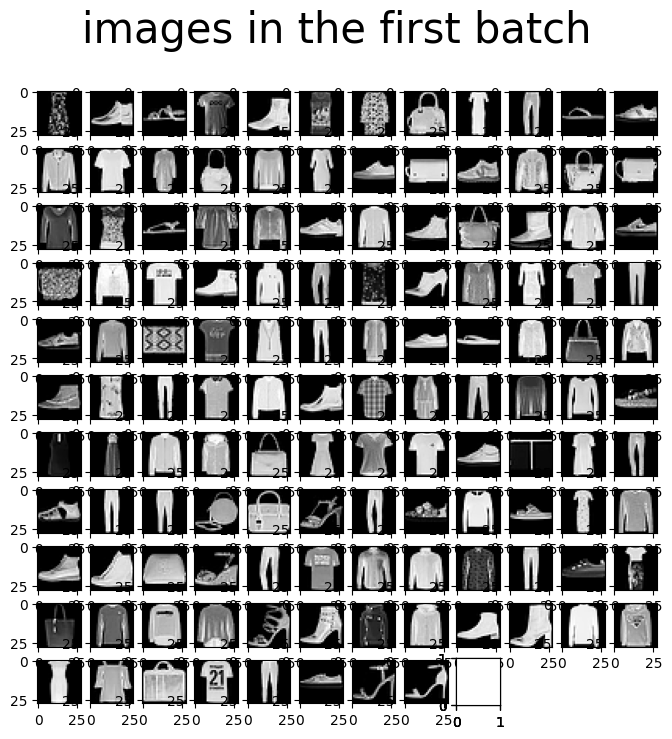

In [8]:
for batch in loader:
    show_images(batch[0], "images in the first batch")
    break

In [9]:
# get available device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device, torch.cuda.get_device_name(0) if "cuda" else "cpu")

cuda NVIDIA A40


## Define DDPM module

In [10]:
class MyDDPM(nn.Module):
    """
    Define a high-level custom DDPM module which is going to take as parameters:
    network: the network used in each denoising step
    n_steps: number of diffusion steps T
    min_beta: value of the first Bt(B1), this is the min ammount of noise to add.
    max_beta: value of the last Bt(Bt), this is the min ammount of noise to add.
    device: device onto the model will runs
    image_chw: tuple cointaining images dimensions.
    """
    def __init__(self, network, n_steps=200, min_beta=10 ** -4, max_beta=0.02, device=None, image_chw=(1, 28, 28)):
        super(MyDDPM, self).__init__()
        self.network = network.to(device)
        self.n_steps = n_steps
        self.min_beta = min_beta
        self.max_beta = max_beta
        self.device = device
        self.image_chw = image_chw
        self.betas = torch.linspace(
            min_beta,
            max_beta,
            n_steps
        ).to(device) # number of steps is typically in order of thousands
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.tensor(
            [torch.prod(self.alphas[:i + 1]) for i in range(len(self.alphas))]).to(device)

    def forward(self, x0, t, eta=None):
        # make input image more noisy
        n, c, h, w = x0.shape
        a_bar = self.alpha_bars[t]

        if eta is None:
            eta = torch.randn(n, c, h, w).to(device)
        
        noisy = a_bar.sqrt().reshape(n, 1, 1, 1) * x0 + (1 - a_bar).sqrt().reshape(n , 1, 1, 1) * eta

        return noisy

    def backward(self, x, t):
        # the network returns its estimation of the noise that was added.
        return self.network(x, t)


## Visualizing forward and backward
As denoising process is independent from forward process, lets create a new method `show_forward`. </br>

Another utility function will be `generate_new_images`

In [11]:
def show_forward(ddpm, loader, device):
    """
    This will show the forward process, it means see the images while adding noise in steps
    """
    for batch in loader:
        imgs = batch[0]
        show_images(imgs, "Original images")
        for percent in [0.25, 0.5, 0.75, 1]:
            show_images(
                ddpm(imgs.to(device),
                [int(percent * ddpm.n_steps) - 1 for _ in range(len(imgs))]),
                f"DDPM noisy images {int(percent * 100)}%"
            )
        break

In [22]:
def generate_new_images(ddpm, n_samples=16, device=None, frames_per_gif=100, gif_name="sampling.gif", c=1, h=28, w=28):
    """
    Given a DDPM model, a number of smaples to be generated and a device, returns some newly generated samples
    """
    frame_idxs = np.linspace(0, ddpm.n_steps, frames_per_gif).astype(np.uint)
    frames = []

    with torch.no_grad():
        if device is None:
            device = ddpm.device
        
        # starting from random noise
        x = torch.rand(n_samples, c, h, w).to(device)

        for idx, t in enumerate(list(range(ddpm.n_steps))[::-1]):
            # estimate noise to be removed
            time_tensor = (torch.ones(n_samples, 1)*t).to(device).long()
            etha_theta = ddpm.backward(x, time_tensor)

            alpha_t = ddpm.alphas[t]
            aplha_t_bar = ddpm.alpha_bars[t]

            # partially denoising the image
            x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - aplha_t_bar).sqrt() * etha_theta)

            if t > 0:
                z = torch.randn(n_samples, c, h, w).to(device)

                # sigma_t squared  = beta_tilda_t
                beta_t = ddpm.betas[t]
                sigma_t = beta_t.sqrt()

                # Adding some more noise like in Langevin Dynamics fashion
                x = x + sigma_t * z
            
            # adding frames to gif
            if idx in frame_idxs or t == 0:
                # putting pixel in range [0, 255]
                normalized = x.clone()
                for i in range(len(normalized)):
                    normalized[i] -= torch.min(normalized[i])
                    normalized[i] *= 255 / torch.max(normalized[i])

                frame = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5))
                frame = frame.cpu().numpy().astype(np.uint8)

                # render frame
                frames.append(frame)
    
    # store gif
    with imageio.get_writer(gif_name, mode="I") as writer:
        for idx, frame in enumerate(frames):
            # convert grayscale to RBG
            rgb_frame = np.repeat(frame, 3, axis=-1)
            writer.append_data(rgb_frame)
            if idx == len(frames) - 1:
                for _ in range(frames_per_gif // 3):
                    writer.append_data(rgb_frame)
    
    return x

## UNet arquitecture
Some points as I understood in my words:
* This UNet is going to have something special, which is conditioning the model with the temporal information.
* The loss is going to be difference bewtween the random noise and the predicted noise.
* To embed the temporal information is going to be used something called `sinusoidal_embedding` which is going to be in charge of maps each time-step to a `time_emb_dim` dimension.

This UNEt arquitecture was arbitrary defined to work with 28x28 spatial resolution images.

In [13]:
def sinusoidal_embedding(n, d):
    """
    Returns the standard positional embedding
    """
    embedding = torch.zeros(n ,d)
    wk = torch.tensor([1 / 10_000 ** (2 * j/d) for j in range(d)])
    wk = wk.reshape((1, d))
    t = torch.arange(n).reshape((n, 1))
    embedding[:, ::2] = torch.sin(t * wk[:, ::2])
    embedding[:, 1::2] = torch.cos(t * wk[:, ::2])

    return embedding

In [14]:
class MyBlock(nn.Module):
    def __init__(self, shape, in_c, out_c, kernel_size=3, stride=1, padding=1, activation=None, normalize=True):
        super(MyBlock, self).__init__()
        self.ln = nn.LayerNorm(shape)
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size, stride, padding)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size, stride, padding)
        self.activation = nn.SiLU() if activation is None else activation
        self.normalize = normalize

    def forward(self, x):
        out = self.ln(x) if self.normalize else x
        out = self.conv1(out)
        out = self.activation(out)
        out = self.conv2(out)
        out = self.activation(out)

        return out

In [15]:
class MyUNet(nn.Module):
    def __init__(self, n_steps=1000, time_embed_dim=100):
        super(MyUNet, self).__init__()
        # sinusoidal embedding
        self.time_embed = nn.Embedding(n_steps, time_embed_dim)
        self.time_embed.weight.data = sinusoidal_embedding(n_steps, time_embed_dim)
        self.time_embed.requires_grad_(False)

        # first half
        self.te1 = self.make_te(time_embed_dim, 1)
        self.b1 = nn.Sequential(
            MyBlock((1, 28, 28), 1, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10)
        )
        self.down1 = nn.Conv2d(10, 10, 4, 2, 1)

        self.te2 = self.make_te(time_embed_dim, 10)
        self.b2 = nn.Sequential(
            MyBlock((10, 14, 14), 10, 20),
            MyBlock((20, 14, 14), 20, 20),
            MyBlock((20, 14, 14), 20, 20)
        )
        self.down2 = nn.Conv2d(20, 20, 4, 2, 1)

        self.te3 = self.make_te(time_embed_dim, 20)
        self.b3 = nn.Sequential(
            MyBlock((20, 7, 7), 20, 40),
            MyBlock((40, 7, 7), 40, 40),
            MyBlock((40, 7, 7), 40, 40)
        )
        self.down3 = nn.Sequential(
            nn.Conv2d(40, 40, 2, 1),
            nn.SiLU(),
            nn.Conv2d(40, 40, 4, 2, 1)
        )

        # bottleneck
        self.te_mid = self.make_te(time_embed_dim, 40)
        self.b_mid = nn.Sequential(
            MyBlock((40, 3, 3), 40, 20),
            MyBlock((20, 3, 3), 20, 20),
            MyBlock((20, 3, 3), 20, 40)
        )

        # second half
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(40, 40, 4, 2, 1),
            nn.SiLU(),
            nn.ConvTranspose2d(40, 40, 2, 1)
        )

        self.te4 = self.make_te(time_embed_dim, 80)
        self.b4 = nn.Sequential(
            MyBlock((80, 7, 7), 80, 40),
            MyBlock((40, 7, 7), 40, 20),
            MyBlock((20, 7, 7), 20, 20)
        )

        self.up2 = nn.ConvTranspose2d(20, 20, 4, 2, 1)
        self.te5 = self.make_te(time_embed_dim, 40)
        self.b5 = nn.Sequential(
            MyBlock((40, 14, 14), 40, 20),
            MyBlock((20, 14, 14), 20, 10),
            MyBlock((10, 14, 14), 10, 10)
        )

        self.up3 = nn.ConvTranspose2d(10, 10, 4, 2, 1)
        self.te_out = self.make_te(time_embed_dim, 20)
        self.b_out = nn.Sequential(
            MyBlock((20, 28, 28), 20, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10, normalize=False)
        )

        self.conv_out = nn.Conv2d(10, 1, 3, 1, 1)

    def forward(self, x, t):
        t = self.time_embed(t)
        n = len(x)
        out1 = self.b1(x + self.te1(t).reshape(n, -1, 1, 1)) # (N, 10, 28, 28)
        out2 = self.b2(self.down1(out1) + self.te2(t).reshape(n, -1, 1, 1)) # (N, 20, 14, 14)
        out3 = self.b3(self.down2(out2) + self.te3(t).reshape(n, -1, 1, 1)) # (N, 40, 7, 7)

        out_mid = self.b_mid(self.down3(out3) + self.te_mid(t).reshape(n, -1, 1, 1)) # (N, 40, 3, 3)

        out4 = torch.cat((out3, self.up1(out_mid)), dim=1) # (N, 80, 7, 7)
        out4 = self.b4(out4 + self.te4(t).reshape(n, -1, 1, 1)) # (N, 20, 7, 7)

        out5 = torch.cat((out2, self.up2(out4)), dim=1) # (N, 40, 14, 14)
        out5 = self.b5(out5 + self.te5(t).reshape(n, -1, 1, 1)) # (N, 10, 14, 14)

        out = torch.cat((out1, self.up3(out5)), dim=1) # (N, 20, 28, 28)
        out = self.b_out(out + self.te_out(t).reshape(n, -1, 1, 1)) # (N, 1, 28, 28)

        out = self.conv_out(out)

        return out
    
    def make_te(self, dim_in, dim_out):
        return nn.Sequential(
            nn.Linear(dim_in, dim_out),
            nn.SiLU(),
            nn.Linear(dim_out, dim_out)
        )

## Instantiating the model


In [16]:
# define the model
n_steps, min_beta, max_beta = 1000, 10 ** -4, 0.02
ddpm = MyDDPM(
    MyUNet(n_steps,), 
    n_steps=n_steps, 
    min_beta=min_beta, 
    max_beta=max_beta, 
    device=device
)

In [17]:
# number of parameters in the model to be learn
sum([p.numel() for p in ddpm.parameters()])

606852

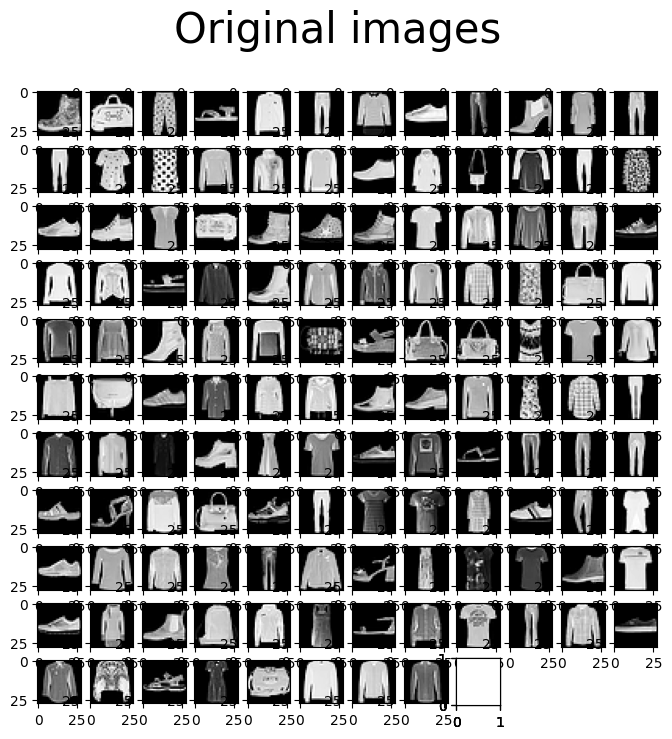

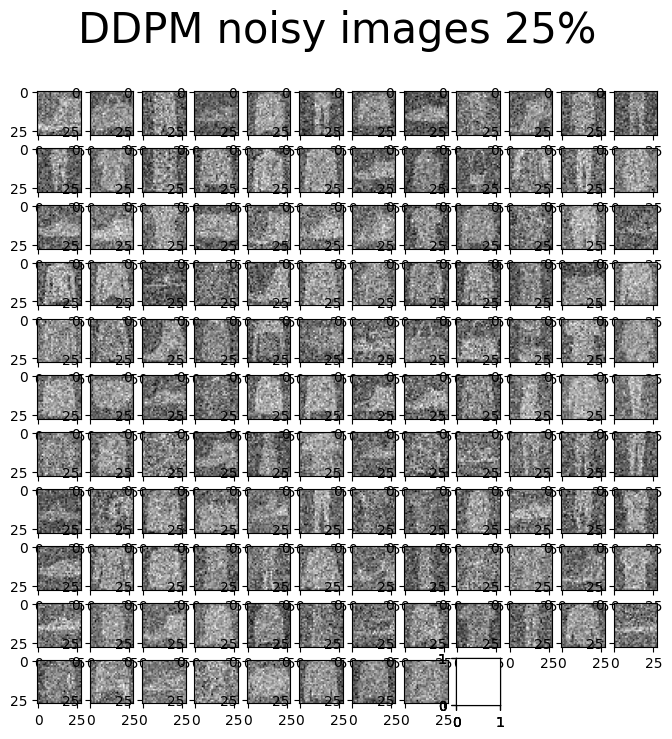

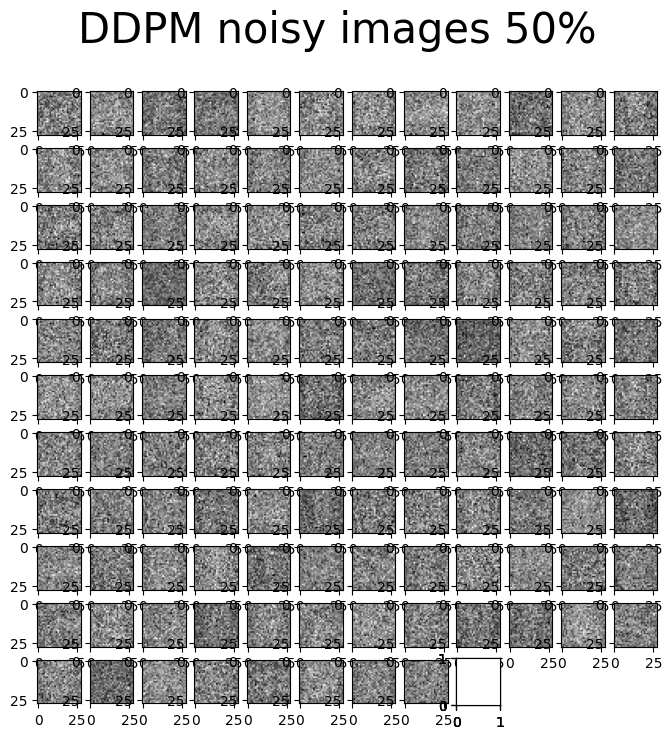

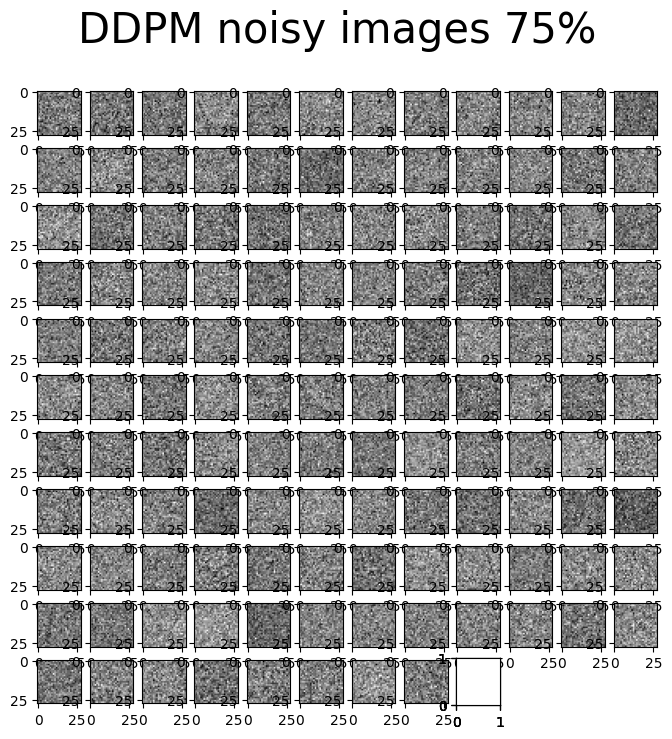

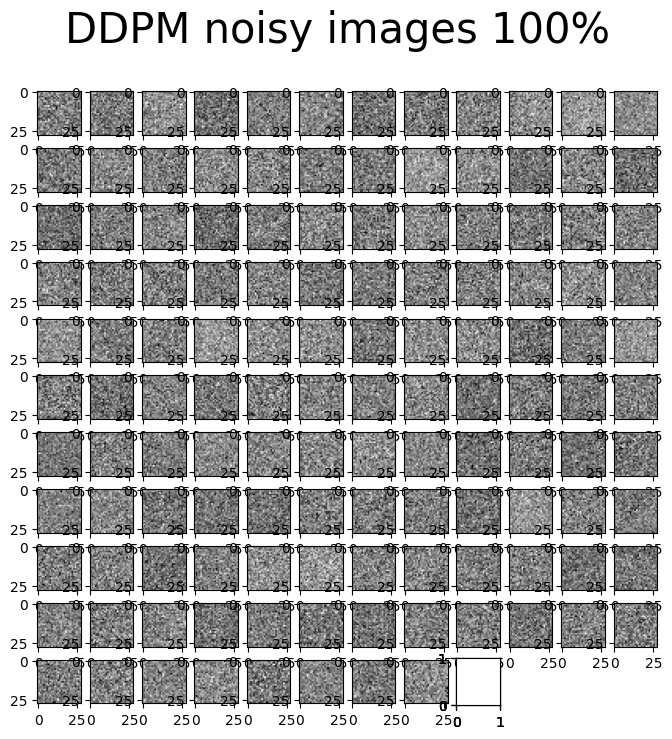

In [18]:
# just show the forward process, which is the noising one
show_forward(ddpm, loader, device)

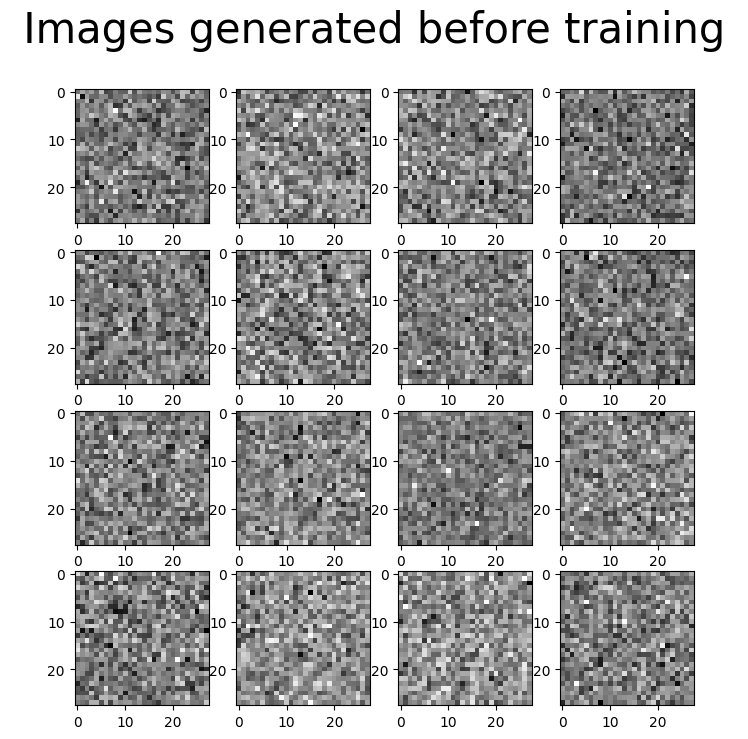

In [23]:
# these are the images generated before training
generated = generate_new_images(ddpm, gif_name="before_training.gif")
show_images(generated, " Images generated before training ")

## Traning loop

In [26]:
def training_loop(ddpm, loader, n_epochs, optim, device, display=False, store_path="ddmp_model.pt"):
    mse = nn.MSELoss()
    best_loss = float("inf") # init loss starting from here to optimize
    n_steps = ddpm.n_steps

    for epoch in tqdm(range(n_epochs), desc="Training progress", colour="#00ff00"):
        epoch_loss = 0.0
        for step, batch in enumerate(tqdm(loader, leave=False, desc=f"Epoch {epoch + 1}/{n_epochs}", colour="#005500")):
            # loading data
            x0 = batch[0].to(device)
            n = len(x0)

            # pick some noise for each of the images batch, and a timestep
            eta = torch.rand_like(x0).to(device)
            t = torch.randint(0, n_steps, (n,)).to(device)

            # compute the noisy image based on x0 and the time-step
            noisy_imgs = ddpm(x0, t, eta)

            # get the model estimation of noise based on the images and the time-step
            eta_theta = ddpm.backward(noisy_imgs, t.reshape(n, -1))

            # optimizing the MSE between the noise plugged and the predicted noise
            loss = mse(eta_theta, eta)
            optim.zero_grad()
            loss.backward()
            optim.step()

            epoch_loss += loss.item() * len(x0) / len(loader.dataset)

        # display images generated at current epoch
        if display:
            show_images(generate_new_images(ddpm, device=device), f"Images generated at epoch {epoch + 1}")
        
        log_string = f"loss at epoch {epoch + 1}: {epoch_loss:.3f}"

        # store model
        if best_loss > epoch_loss:
            best_loss = epoch_loss
            torch.save(ddpm.state_dict(), store_path)
            log_string += " --> Best model ever (stored)"

        print(log_string)

In [27]:
# train
store_path = "ddpm_fashion.pt" if fashion else "ddpm_mnist.pt"
if not no_train:
    training_loop(ddpm, loader, n_epochs, optim=Adam(ddpm.parameters(), lr), device=device, store_path=store_path)

Training progress:   5%|▌         | 1/20 [00:20<06:32, 20.66s/it]

loss at epoch 1: 0.041 --> Best model ever (stored)



Training progress:  10%|█         | 2/20 [00:40<06:06, 20.35s/it]

loss at epoch 2: 0.013 --> Best model ever (stored)



Training progress:  15%|█▌        | 3/20 [01:01<05:45, 20.33s/it]

loss at epoch 3: 0.011 --> Best model ever (stored)



Training progress:  20%|██        | 4/20 [01:21<05:24, 20.27s/it]

loss at epoch 4: 0.011 --> Best model ever (stored)



Training progress:  25%|██▌       | 5/20 [01:41<05:03, 20.25s/it]

loss at epoch 5: 0.010 --> Best model ever (stored)



Training progress:  30%|███       | 6/20 [02:01<04:44, 20.30s/it]

loss at epoch 6: 0.010 --> Best model ever (stored)



Training progress:  35%|███▌      | 7/20 [02:22<04:23, 20.30s/it]

loss at epoch 7: 0.009 --> Best model ever (stored)



Training progress:  40%|████      | 8/20 [02:42<04:03, 20.33s/it]

loss at epoch 8: 0.009 --> Best model ever (stored)



Training progress:  45%|████▌     | 9/20 [03:02<03:43, 20.29s/it]

loss at epoch 9: 0.009 --> Best model ever (stored)



Training progress:  50%|█████     | 10/20 [03:23<03:23, 20.32s/it]

loss at epoch 10: 0.009 --> Best model ever (stored)



Training progress:  55%|█████▌    | 11/20 [03:43<03:02, 20.32s/it]

loss at epoch 11: 0.009 --> Best model ever (stored)



Training progress:  60%|██████    | 12/20 [04:03<02:42, 20.31s/it]

loss at epoch 12: 0.009 --> Best model ever (stored)



Training progress:  65%|██████▌   | 13/20 [04:24<02:22, 20.33s/it]

loss at epoch 13: 0.009



Training progress:  70%|███████   | 14/20 [04:44<02:01, 20.29s/it]

loss at epoch 14: 0.008 --> Best model ever (stored)



Training progress:  75%|███████▌  | 15/20 [05:04<01:41, 20.27s/it]

loss at epoch 15: 0.008 --> Best model ever (stored)



Training progress:  80%|████████  | 16/20 [05:24<01:20, 20.25s/it]

loss at epoch 16: 0.008 --> Best model ever (stored)



Training progress:  85%|████████▌ | 17/20 [05:45<01:00, 20.28s/it]

loss at epoch 17: 0.008 --> Best model ever (stored)



Training progress:  90%|█████████ | 18/20 [06:05<00:40, 20.30s/it]

loss at epoch 18: 0.008 --> Best model ever (stored)



Training progress:  95%|█████████▌| 19/20 [06:25<00:20, 20.32s/it]

loss at epoch 19: 0.008



Training progress: 100%|██████████| 20/20 [06:46<00:00, 20.31s/it]


loss at epoch 20: 0.008 --> Best model ever (stored)


## Testing trained model

In [28]:
# load trained model
best_model = MyDDPM(MyUNet(), n_steps=n_steps, device=device)
best_model.load_state_dict(torch.load(store_path, map_location=device))
best_model.eval()
print("Model loaded")

Model loaded


Generating new images


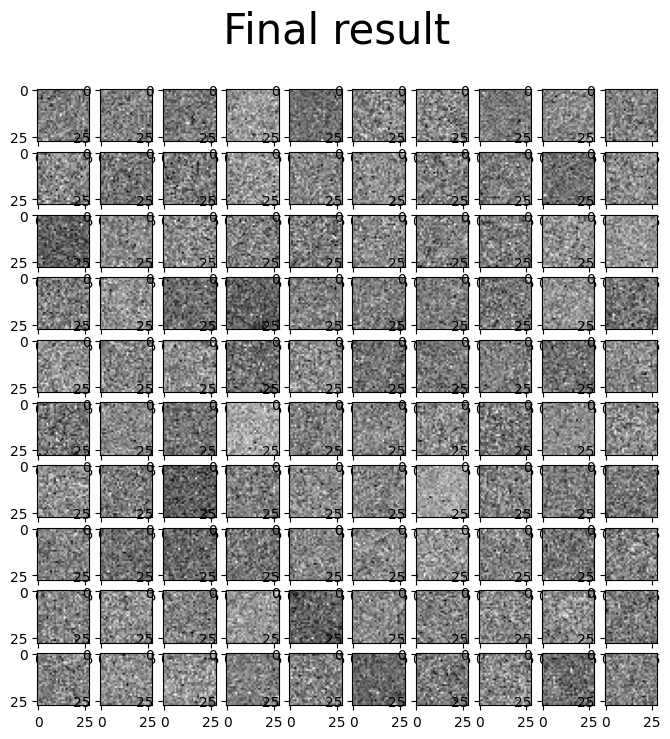

In [29]:
print("Generating new images")
generated = generate_new_images(
    best_model,
    n_samples=100,
    device=device,
    gif_name="fashion.gif" if fashion else "mnist.gif"
)
show_images(generated, " Final result ")

Really poor comparing to the guide followed. Don't know why if I used the same parameters and arquitectures.

## Visualize the diffusion

In [30]:
from IPython.display import Image

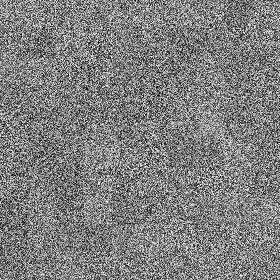

In [31]:
Image(open("fashion.gif" if fashion else "mnist.gif", "rb").read())